<a href="https://colab.research.google.com/github/teddius/TensorFlow_Chatbot_for_20171128_Talk_BotsHub_Meetup_Vienna/blob/master/speech2text_introduction_for_pvi_WS2020.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Speech Recognition Introduction for Programming Voice Interfaces WS2020
=====================================================================================================

Author: [Andreas Rath](https://github.com/teddius) - andreas.rath@ondewo.com

This example shows how to achieve speech recognition by using the library SpeechRecognition.


This lecture is based on tutorial and code from
* Tutorial Speech Recognition https://realpython.com/python-speech-recognition/
* Recording audio in browser https://gist.github.com/korakot/c21c3476c024ad6d56d5f48b0bca92be 
* Test and Play Audio in Colab https://colab.research.google.com/drive/1--xY78_ZTFwpI7F2ZfaeyFKiAOG2nkwd

## Install dependencies for recording and playing audio in python

In [1]:
!sudo apt-get install python-pyaudio python3-pyaudio

Reading package lists... Done
Building dependency tree       
Reading state information... Done
python-pyaudio is already the newest version (0.2.11-1build2).
python3-pyaudio is already the newest version (0.2.11-1build2).
0 upgraded, 0 newly installed, 0 to remove and 14 not upgraded.


In [2]:
!pip install SpeechRecognition sounddevice pyaudio scipy calc pydub

In [3]:
# importing dependencies
import numpy as np
import librosa
from IPython.display import Javascript
from IPython.display import Audio
from google.colab import output
from base64 import b64decode
from io import BytesIO
from pydub import AudioSegment
from scipy.io import wavfile

# Set to True if we are in colaboratory of False elsewere
colaboratory = True

if colaboratory:
    # Load the calc module
    !rm calc.*
    !wget https://raw.githubusercontent.com/R6500/Python-bits/master/Modules/calc.py

#Import the module
import calc

# Erase output after import
from IPython.display import clear_output
clear_output()

# Check loaded module
try:
    print('calc version: ',calc.version)
except:
    print('Error loading the calc module')

calc version:  2/7/2018B


## Basic Audio Processing
based on https://realpython.com/python-speech-recognition/


In [4]:
# Download frindly audio sample file with no backgroud noice
!wget https://raw.githubusercontent.com/realpython/python-speech-recognition/master/audio_files/harvard.wav

--2020-12-13 11:19:03--  https://raw.githubusercontent.com/realpython/python-speech-recognition/master/audio_files/harvard.wav
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3249924 (3.1M) [audio/wav]
Saving to: ‘harvard.wav.5’

harvard.wav.5       100%[===================>]   3.10M  --.-KB/s    in 0.1s    

2020-12-13 11:19:03 (32.1 MB/s) - ‘harvard.wav.5’ saved [3249924/3249924]



In [5]:
harvard_filepath='harvard.wav'
data = wavfile.read(harvard_filepath)

# Separete the object elements
framerate = data[0]
sounddata = data[1]
time      = np.arange(0,len(sounddata))/framerate

# Show information about the object
print('Sample rate (Framerate):',framerate,'Hz')
print('Total time:',len(sounddata)/framerate,'s')

Audio(harvard_filepath)

Sample rate (Framerate): 44100 Hz
Total time: 18.356190476190477 s


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: WavFileWarning: Chunk (non-data) not understood, skipping it.
  


In [6]:

# Load the file on an object
data = wavfile.read(harvard_filepath)

# Separete the object elements
framerate = data[0]
sounddata = data[1]
time      = np.arange(0,len(sounddata))/framerate

# Show information about the object
print('Sample rate:',framerate,'Hz')
print('Total time:',len(sounddata)/framerate,'s')

Sample rate: 44100 Hz
Total time: 18.356190476190477 s


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: WavFileWarning: Chunk (non-data) not understood, skipping it.
  This is separate from the ipykernel package so we can avoid doing imports until


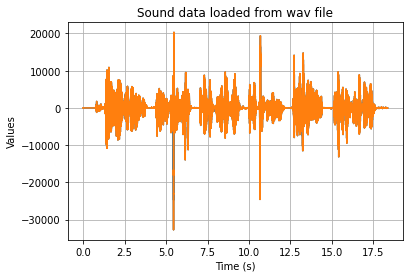

In [7]:
# Show the sound data
calc.plot11(time,sounddata,"Sound data loaded from wav file","Time (s)","Values")

In [8]:
# Download unfriendly audio sample with a lot of background noice
!wget https://raw.githubusercontent.com/realpython/python-speech-recognition/master/audio_files/jackhammer.wav


--2020-12-13 11:19:05--  https://raw.githubusercontent.com/realpython/python-speech-recognition/master/audio_files/jackhammer.wav
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 600204 (586K) [audio/wav]
Saving to: ‘jackhammer.wav.7’

jackhammer.wav.7    100%[===================>] 586.14K  --.-KB/s    in 0.03s   

2020-12-13 11:19:05 (17.3 MB/s) - ‘jackhammer.wav.7’ saved [600204/600204]



In [9]:
# Load the file on an object
jackhammer_filepath='jackhammer.wav'
data = wavfile.read(jackhammer_filepath)

# Separete the object elements
framerate = data[0]
sounddata = data[1]
time      = np.arange(0,len(sounddata))/framerate

# Show information about the object
print('Sample rate (Framerate):',framerate,'Hz')
print('Total time:',len(sounddata)/framerate,'s')

Audio(jackhammer_filepath)

Sample rate (Framerate): 44100 Hz
Total time: 3.3467120181405896 s


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: WavFileWarning: Chunk (non-data) not understood, skipping it.
  This is separate from the ipykernel package so we can avoid doing imports until


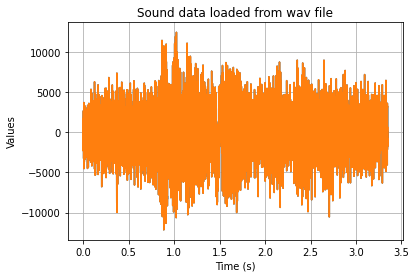

In [10]:
# Show the sound data
calc.plot11(time,sounddata,"Sound data loaded from wav file","Time (s)","Values")

In [11]:
###############################################################################
# RECORDING AUDIO IN COLAB - sometimes buggy, definitely not during hangouts
# https://gist.github.com/korakot/c21c3476c024ad6d56d5f48b0bca92be
###############################################################################
# all imports
RECORD = """
const sleep  = time => new Promise(resolve => setTimeout(resolve, time))
const b2text = blob => new Promise(resolve => {
  const reader = new FileReader()
  reader.onloadend = e => resolve(e.srcElement.result)
  reader.readAsDataURL(blob)
})
var record = time => new Promise(async resolve => {
  stream = await navigator.mediaDevices.getUserMedia({ audio: true })
  recorder = new MediaRecorder(stream)
  chunks = []
  recorder.ondataavailable = e => chunks.push(e.data)
  recorder.start()
  await sleep(time)
  recorder.onstop = async ()=>{
    blob = new Blob(chunks)
    text = await b2text(blob)
    resolve(text)
  }
  recorder.stop()
})
"""

def record(sec=3):
  display(Javascript(RECORD))
  s = output.eval_js('record(%d)' % (sec*1000))
  b = b64decode(s.split(',')[1])
  audio = AudioSegment.from_file(BytesIO(b))
  return audio

def recordToFile(sec=3, file_path="audio.wav"):
  display(Javascript(RECORD))
  s = output.eval_js('record(%d)' % (sec*1000))
  b = b64decode(s.split(',')[1])
  with open(file_path,'wb') as f:
    f.write(b)
  return file_path  # or webm ?

# audio=record(sec=3)
# audio_filepath=recordToFile(sec=3,file_path="audio.wav")


## Fun with Audio Processing
based on https://colab.research.google.com/drive/1--xY78_ZTFwpI7F2ZfaeyFKiAOG2nkwd

In [12]:
# Create a sound
framerate = 44100
t = np.linspace(0,5,framerate*5)
data = np.sin(2*np.pi*220*t) + np.sin(2*np.pi*224*t)

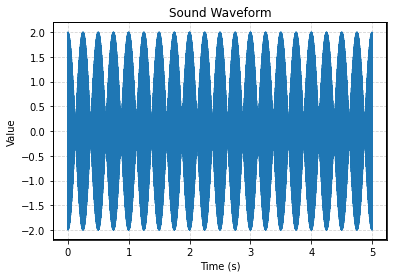

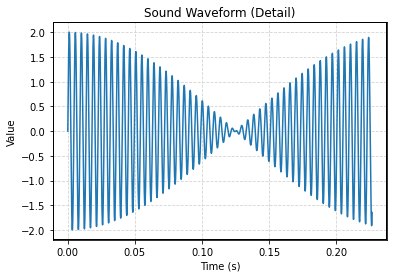

In [13]:
# Indicate the calc module if we are inside colaboratory
calc.setColaboratory(colaboratory)

# Show waveform
calc.plot11(t,data,"Sound Waveform","Time (s)","Value")

# We can zoom the start of the waveform
calc.plot11(t[0:10000],data[0:10000],"Sound Waveform (Detail)","Time (s)","Value")

In [14]:
# Generate a player for mono sound
Audio(data,rate=framerate)

In [15]:
# Take a 1s piece of the mono sound
data2 = data[0:framerate]

# Generate a player for mono sound
Audio(data2,rate=framerate,autoplay=True)

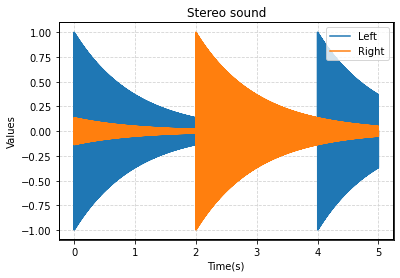

In [16]:
# Base sound
def base(t):
    return np.sin(2*np.pi*220*t)*np.exp(-t)
    
tLeft  = 4*(t/4 - np.fix(t/4))
left   = base(tLeft)

tRight = 4*((t+2)/4 - np.fix((t+2)/4))
right  = base(tRight)

# Show sound
calc.plot1n(t,[left,right],"Stereo sound","Time(s)","Values",["Left","Right"])

In [17]:
# Can also do stereo or more channels
Audio([left, right],rate=framerate)

In [18]:
# Download another sound file
!wget https://github.com/R6500/Python-bits/raw/master/Colaboratory/Sounds/Bicycle%20bell%203.wav

--2020-12-13 11:19:08--  https://github.com/R6500/Python-bits/raw/master/Colaboratory/Sounds/Bicycle%20bell%203.wav
Resolving github.com (github.com)... 192.30.255.112
Connecting to github.com (github.com)|192.30.255.112|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/R6500/Python-bits/master/Colaboratory/Sounds/Bicycle%20bell%203.wav [following]
--2020-12-13 11:19:08--  https://raw.githubusercontent.com/R6500/Python-bits/master/Colaboratory/Sounds/Bicycle%20bell%203.wav
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1869076 (1.8M) [audio/wav]
Saving to: ‘Bicycle bell 3.wav.5’

Bicycle bell 3.wav. 100%[===================>]   1.78M  --.-KB/s    in 0.1s    

2020-12-13 11:19:09 (14.5 MB/s) - ‘Bicycl

Sample rate: 48000 Hz
Total time: 19.4594375 s


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: WavFileWarning: Chunk (non-data) not understood, skipping it.
  


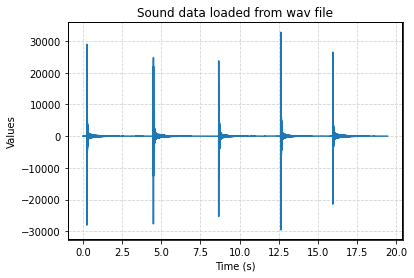

In [19]:
# Load the file on an object
data = wavfile.read('Bicycle bell 3.wav')

# Separete the object elements
framerate = data[0]
sounddata = data[1]
time      = np.arange(0,len(sounddata))/framerate

# Show information about the object
print('Sample rate:',framerate,'Hz')
print('Total time:',len(sounddata)/framerate,'s')

# Show the sound data
calc.plot11(time,sounddata,"Sound data loaded from wav file","Time (s)","Values")

In [20]:
# Generate a player for mono sound
Audio(sounddata,rate=framerate)

# SpeechRecognition library in Python

Library for performing speech recognition, with support for several engines and APIs, online and offline.

Speech recognition engine/API support:
* CMU Sphinx (works offline)
* Google Speech Recognition
* Google Cloud Speech API
* Wit.ai
* Microsoft Bing Voice Recognition
* Houndify API
* IBM Speech to Text
* Snowboy Hotword Detection (works offline)

Check it out at: https://pypi.org/project/SpeechRecognition/

In [21]:
import speech_recognition as sr

# create a recognizer instance
r = sr.Recognizer()
sr.__version__

'3.8.1'

In [22]:
# Example 1 Harvard Audio File (clean, no background noise)
Audio(harvard_filepath)

In [23]:
# open recording
harvard = sr.AudioFile(harvard_filepath)
with harvard as source:
     harvard_audio = r.record(source)

# recognize the audio input with google
google_s2t_output = r.recognize_google(harvard_audio)
print(google_s2t_output[0:100])

the stale smell of old beer lingers it takes heat to bring out the odor a cold dip restores health a


In [24]:
# Transcribe speech-to-text (s2t) - get best result
%%time
google_s2t_output = r.recognize_google(harvard_audio)
print(google_s2t_output[0:100])

the stale smell of old beer lingers it takes heat to bring out the odor a cold dip restores health a
CPU times: user 10.3 ms, sys: 12.9 ms, total: 23.2 ms
Wall time: 3.22 s


In [25]:
# Transcribe speech-to-text (s2t) - get also alternative results
%%time
r.recognize_google(harvard_audio,show_all=True)

CPU times: user 11.7 ms, sys: 11 ms, total: 22.7 ms
Wall time: 2.98 s


{'alternative': [{'confidence': 0.84071261,
   'transcript': 'the stale smell of old beer lingers it takes heat to bring out the odor a cold dip restores health and zest a salt pickle taste fine with ham tacos al Pastore are my favorite a zestful food is be hot cross bun'},
  {'transcript': 'the stale smell of old beer lingers it takes heat to bring out the odor a cold dip restores health and zest a salt pickle taste fine with ham tacos al Pastore are my favorite a zestful food is the hot cross bun'},
  {'transcript': 'the stale smell of old beer lingers it takes heat to bring out the odor a cold dip restores health and zest a salt pickle taste fine with ham tacos al Pastore are my favorite a zestful food is B hot cross bun'},
  {'transcript': 'the stale smell of old beer lingers it takes heat to bring out the odor a cold dip restores health and zest a salt pickle taste fine with ham tacos al pastor are my favorite a zestful food is be hot cross bun'},
  {'transcript': 'the stale smell

In [39]:
%%time
# Levensthein distance calculation in linear time
# based on https://colab.research.google.com/drive/1VaDXKJKmZk3WqaKD5kRiYpOEzNSv8FVY
#@title Input strings for Levensthein distance { display-mode: "both" }
a = "the stale smell of old beer lingers it takes heat to bring out the odor a cold dip restores health and zest a salt pickle taste fine with ham tacos al Pastore are my favorite a zestful food is be hot cross bun" #@param {type:"string"}
b = "the stale smell of old beer lingers it takes heat to bring out the Oder a cold dip restores health and zest a salt pickle taste fine with ham tacos al Pastore are my favorite a zestful food is be hot cross bun" #@param {type:"string"}
s = 20 

m = len(a)
n = len(b)
d={}  # we store the dynamic programming matrix in a dictionary
db={} # and the backtracking matrix, too.

# how many diagonals off the main diagonal are we considering
off = round(s/2)

def min_dir(dN, dW, dNW):
  """Returns the minimum of dN, dW, dNW and a set with the directions N, W, NW, which held the minimal value.
  dN, dW, and dNW can also be None, but at least one must be not None.
  min_dir(2,2,3) return {"N","W"} and min_dir(3,2,1) {"NW"}.
  """
  minimum = min(filter(lambda x: not x is None, [dN,dW,dNW]))
  direction = set([]) # empty set
  if not dN is None and dN == minimum:
    direction.add("N")
  if not dW is None and dW == minimum:
    direction.add("W")
  if not dNW is None and dNW == minimum:
    direction.add("NW")
  return (minimum, direction)


def lev(a,b):
  """Computes the Levenshtein distance (and backtracking matrix) between strings a and b.""" 
  
  d[0,0] = 0 
  db[0,0] = set([]) # empty set
  ops = 0 
  
  # Initialise the first column
  for i in range(1,off+1):
    d[i,0] = i
    db[i,0] = {"N"}
    ops += 1
    
  # Initialise the first row
  for j in range(1,off+1):
    d[0,j] = j
    db[0,j] = {"W"}
    ops += 1
    
  # Fill all cells of the matrix
  for i in range(1,m+1):
    for j in range(max(1,i-off),  min(i+off+1,n+1)):
      # if letters are the same, no edit operation is used, otherwise it is one (replace operation)
      if a[i-1] == b[j-1]: 
        s = 0
      else:        
        s = 1
      if (i-1,j) in d: 
        dN = d[i-1,j]+1
      else: 
        dN = None
      if (i,j-1) in d:
        dW = d[i  ,j-1]+1
      else:
        dW = None
      if (i-1,j-1) in d:
        dNW = d[i-1,j-1]+s
      else:
        dNW = None
      # Get the minimum of the scores N, W, and NW and remember the direction.
      (d[i,j], db[i,j]) = min_dir(dN, dW, dNW)
      ops += 3
          
  print("The algorithm used %d plus operations.\n"%(ops))
  if (m,n) in d:
    return d[m,n]
  else:
    return None

def print_lev(a,b, i,j, line1, line2):
  if "N" in db[i,j]:
    print_lev(a,b,i-1,j,   a[i-1]+line1,    "-"+line2)
  if "W" in db[i,j]:
    print_lev(a,b,i  ,j-1,    "-"+line1, b[j-1]+line2)
  if "NW" in db[i,j]:
    print_lev(a,b,i-1,j-1, a[i-1]+line1, b[j-1]+line2)
  if db[i,j]==set([]): # empty set. we have reached the top left corner of db
    print()
    print(line1)       # and have collected the full alignment
    print(line2)   


print("Dynamic programming to compute the Levenshtein distance of two strings.\n")

ld = lev(a,b)
if ld:
  print( print_lev(a,b,len(a),len(b), "", "") )
  print()
  print("The Levenshtein distance is %d."%(ld))

else:
  print("Levensthein distance is above required cut-off")

Dynamic programming to compute the Levenshtein distance of two strings.

The algorithm used 12857 plus operations.


the stale smell of old beer lingers it takes heat to bring out the odor a cold dip restores health and zest a salt pickle taste fine with ham tacos al Pastore are my favorite a zestful food is be hot cross bun
the stale smell of old beer lingers it takes heat to bring out the Oder a cold dip restores health and zest a salt pickle taste fine with ham tacos al Pastore are my favorite a zestful food is be hot cross bun
None

The Levenshtein distance is 2.
CPU times: user 11.3 ms, sys: 2.05 ms, total: 13.3 ms
Wall time: 13.1 ms


In [27]:
# Transcribe with bing, ibm, etc. etc.
# bing_s2t_output = r.recognize_bing(harvard_audio,key="")
# print(bing_s2t_output[0:100])

# ibm_s2t_output = r.recognize_ibm(harvard_audio,username="",password="",language="",show_all=True)
# print(ibm_s2t_output[0:100])

In [28]:
# Example 2 Jackhammer Audio File (noisy, lots of background noise)
Audio(jackhammer_filepath)

In [29]:
jackhammer = sr.AudioFile('jackhammer.wav')
with jackhammer as source:
     audio = r.record(source)

r.recognize_google(audio, show_all=True)

{'alternative': [{'transcript': 'the stale smell of old gear vendors'},
  {'transcript': 'the snail smelly old gear vendors'},
  {'transcript': 'the smell smell of old gear vendors'},
  {'transcript': 'the snail smell of old gear vendors'},
  {'transcript': 'the snail smelly old beer drinkers'},
  {'transcript': 'the smell smelly old gear vendors'},
  {'transcript': 'the snail snellie old gear vendors'},
  {'transcript': 'the snail smelly holed gear vendors'},
  {'transcript': 'the snail smell gear vendors'},
  {'transcript': 'the snail smell of gear vendors'}],
 'final': True}

In [30]:
# reducing noise
jackhammer = sr.AudioFile('jackhammer.wav')
with jackhammer as source:
     # TIP: use background noise adjustment 
     r.adjust_for_ambient_noise(source)
     audio = r.record(source)

r.recognize_google(audio)

'still smell like old beer drinkers'

In [40]:
#@title Input strings for Levensthein distance { display-mode: "both" }
a = "the stale smell of old gear vendors" #@param {type:"string"}
b = "the snail smell of gear vendors" #@param {type:"string"}
s = 20 

m = len(a)
n = len(b)
d={}  # we store the dynamic programming matrix in a dictionary
db={} # and the backtracking matrix, too.
# how many diagonals off the main diagonal are we considering
off = round(s/2)
ld = lev(a,b)
if ld:
    print( print_lev(a,b,len(a),len(b), "", "") )
    print()
    print("The Levenshtein distance is %d."%(ld))
else:
    print("Levensthein distance is above required cut-off")

The algorithm used 1745 plus operations.


the sta-le smell of old gear vendors
the snail- smell of ----gear vendors

the stale smell of old gear vendors
the snail smell of ----gear vendors

the sta-le smell of old gear vendors
the snail- smell of---- gear vendors

the stale smell of old gear vendors
the snail smell of---- gear vendors
None

The Levenshtein distance is 7.
